In [57]:
%pip install enlib

Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement enlib (from versions: none)

[notice] A new release of pip is available: 23.0.1 -> 25.2
[notice] To update, run: python3 -m pip install --upgrade pip
ERROR: No matching distribution found for enlib


In [1]:
import healpy as hp, numpy as np, matplotlib.pyplot as plt
from pixell import enmap, enplot, utils, reproject
from astropy.coordinates import SkyCoord
from astropy.io import fits
import astropy.units as u
import matplotlib.patheffects as path_effects
from astropy.wcs import WCS
from tqdm import tqdm

In [2]:
# ymap = hp.read_map("PR4_NILC_y_map.fits", field=(0), h=False)
planck_hpm = hp.read_map("/home/jupyter/datasphere/filestore/datasets/PR4_NILC_y_map.fits", field=(1), h=False)


In [3]:
planck_hpm, len(planck_hpm)

(array([1.84982872e-06, 1.63043588e-06, 1.28870412e-06, ...,
        8.28642061e-07, 1.44669558e-06, 1.15862287e-06], dtype='>f8'),
 50331648)

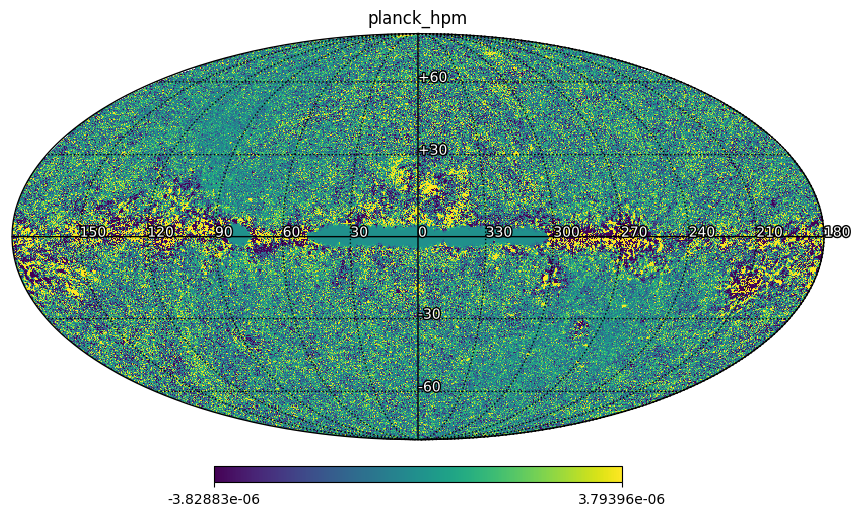

In [9]:
hp.mollview(planck_hpm, 
            min=np.percentile(planck_hpm, 5),    
            max=np.percentile(planck_hpm, 95),
            title='planck_hpm', fig=1)
incolor = "white"
fgcolor = "black"
lw = 2

# Horizontal labels
lon_values = [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]
for lon in lon_values:
    text_label = str(lon)
    hp.visufunc.projtext(lon, 0.0, text_label, lonlat=True, coord="C",
        color=incolor).set_path_effects([path_effects.Stroke(linewidth=lw,
        foreground=fgcolor),path_effects.Normal()])

# Vertical labels at lon=0
lat_values_0 = [30, 60, -30, -60]
for lat in lat_values_0:
    text_label = f"{'+' if lat > 0 else '-'}{abs(lat)}"
    hp.visufunc.projtext(0.0, lat, text_label, lonlat=True, coord="C",
        color=incolor).set_path_effects([path_effects.Stroke(linewidth=lw,
        foreground=fgcolor),path_effects.Normal()])

hp.graticule()


In [32]:
path_y = './'
ymap2 = enmap.read_map(path_y + 'ilc_actplanck_ymap.fits')
# ymap2 = enmap.read_map(path_y + 'wide_mask_GAL070_apod_1.50_deg_wExtended.fits')

In [35]:
def eshow(x,**kwargs): 
    ''' Define a function to help us plot the maps neatly '''
    plots = enplot.get_plots(x, **kwargs)
    enplot.show(plots, method = "ipython")

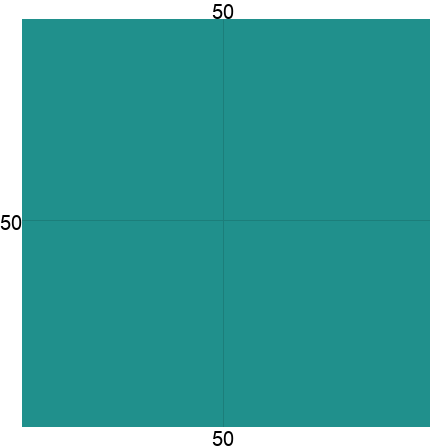

ndmap([[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]],car:{cdelt:[0.008333,0.008333],crval:[0,0],crpix:[-5931.00,-5931.00]})

In [36]:
patch_size = 1.7*40/60
ra_center, dec_center = 50* utils.degree, 50* utils.degree
radius  = patch_size/2. * utils.degree
imap_sub = ymap2.submap([[dec_center - radius, ra_center - radius], [dec_center + radius, ra_center + radius]])
eshow(imap_sub, upgrade=3, color='viridis')
imap_sub

In [ ]:
hpm = reproject.map2healpix(ymap2, nside=2048, lmax=6000, out=None,
                            rot=None, spin=[0,2], method="spline", order=0,
                            extensive=False, bsize=100000, nside_mode="pow2",
                            boundary="constant", verbose=False)


In [ ]:
len(hpm), 50331648 / len(hpm)

In [ ]:
hp.mollview(hpm, 
            min=np.percentile(hpm, 5),    
            max=np.percentile(hpm, 95),
            title='hpm', fig=1)
incolor = "white"
fgcolor = "black"
lw = 2

# Horizontal labels
lon_values = [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]
for lon in lon_values:
    text_label = str(lon)
    hp.visufunc.projtext(lon, 0.0, text_label, lonlat=True, coord="C",
        color=incolor).set_path_effects([path_effects.Stroke(linewidth=lw,
        foreground=fgcolor),path_effects.Normal()])

# Vertical labels at lon=0
lat_values_0 = [30, 60, -30, -60]
for lat in lat_values_0:
    text_label = f"{'+' if lat > 0 else '-'}{abs(lat)}"
    hp.visufunc.projtext(0.0, lat, text_label, lonlat=True, coord="C",
        color=incolor).set_path_effects([path_effects.Stroke(linewidth=lw,
        foreground=fgcolor),path_effects.Normal()])

hp.graticule()


In [ ]:
ra_center, dec_center = 40, 4
hp.gnomview(ymap, rot=(ra_center, dec_center), coord=('G', 'C'), xsize=40, reso=1.7,
            cmap="viridis", return_projected_map=False)
plt.show()
# ra_center, dec_center = 40* utils.degree, 4* utils.degree
img = hp.gnomview(hpm_g2, rot=(ra_center, dec_center), coord=['C', 'C'],
                  return_projected_map=True, xsize=40 * 1.7 / 0.43, 
                  no_plot=False, reso=0.43)
plt.show()

patch_size = 1.7*40/60
ra_center, dec_center = 40* utils.degree, 4* utils.degree
radius  = patch_size/2. * utils.degree
imap_sub = ymap2.submap([[dec_center - radius, ra_center - radius], [dec_center + radius, ra_center + radius]])
eshow(imap_sub, upgrade=3, color='viridis')
max(max(x) for x in imap_sub), min(min(x) for x in imap_sub)

In [ ]:
plt.imsave("saved_patch.png", imap_sub, cmap='viridis', origin='lower')

In [17]:
vec = hp.ang2vec(np.radians(90), np.radians(0))
print(vec), print(sum(vec[i]**2 for i in range(3))**0.5);

[1.000000e+00 0.000000e+00 6.123234e-17]
1.0


In [29]:
# ymap_without_part = ymap.copy()
# hpm_without_part = hpm.copy()
vec = hp.ang2vec(np.radians(90), np.radians(10))
ipix_disc1 = hp.query_disc(nside=2048*4, vec=vec, radius=np.radians(4.3/60))
vec = hp.ang2vec(np.radians(40), np.radians(29))
ipix_disc2 = hp.query_disc(nside=2048*4, vec=vec, radius=np.radians(4.3/60))
# ymap_without_part[ipix_disc1] = -3e-6

# hpm_without_part[ipix_disc2] = -3e-6
print(len(ipix_disc1), len(ipix_disc2), len(ipix_disc1) / len(ipix_disc2))

317 315 1.0063492063492063


In [33]:
def create_square_patch(center_theta, center_phi, patch_size_deg, nside):
    """Создает квадратный патч фиксированного размера"""
    patch_size_rad = np.radians(patch_size_deg)
    
    # Создаем сетку углов для квадратного патча
    theta_range = np.linspace(center_theta - patch_size_rad/2, center_theta + patch_size_rad/2, patch_size_deg)
    phi_range = np.linspace(center_phi - patch_size_rad/2, center_phi + patch_size_rad/2, patch_size_deg)
    
    theta_grid, phi_grid = np.meshgrid(theta_range, phi_range)
    theta_flat = theta_grid.flatten()
    phi_flat = phi_grid.flatten()
    
    # Получаем значения карты в этих точках через интерполяцию
    patch_values = hp.get_interp_val(act_hpm, theta_flat, phi_flat)
    
    return patch_values.reshape(patch_size_deg, patch_size_deg)

In [44]:
patch_size = 64
patch1 = create_square_patch(np.radians(0), np.radians(0), patch_size, 2048*4)
patch2 = create_square_patch(np.radians(40), np.radians(29), patch_size, 2048*4)

print(f"Размеры патчей: {patch1.shape}, {patch2.shape}", patch1)

Размеры патчей: (64, 64), (64, 64) [[-4.26792655e-11  1.78005791e-11  5.71269073e-12 ... -6.25247200e-06
   4.97776199e-09  2.35367695e-06]
 [ 1.50939914e-11 -9.42815069e-12  1.78012443e-12 ...  8.37683711e-07
  -8.59448574e-06  2.79883996e-06]
 [-8.70126216e-12 -2.47392269e-11  3.05750643e-11 ...  8.91385021e-07
   1.95145799e-06 -1.36004714e-06]
 ...
 [-4.26012681e-13  8.17174240e-12  2.10195020e-11 ...  6.49944371e-08
   5.68407154e-08  7.37741265e-08]
 [ 1.47172871e-11  1.27594551e-12 -9.45757379e-12 ...  3.23290872e-08
   3.64399151e-08  3.95085774e-08]
 [ 5.34698200e-11 -7.18855541e-12 -1.73656864e-12 ...  2.30162454e-08
   3.57432319e-08  4.03996293e-08]]


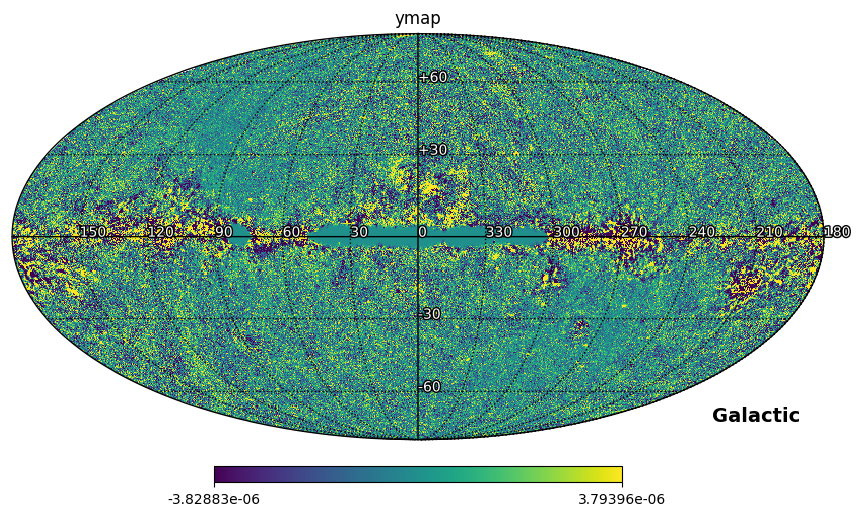

In [37]:
hp.mollview(ymap, 
            min=np.percentile(ymap, 5),    
            max=np.percentile(ymap, 95),
            title='ymap', fig=1, coord=["G", "G"])
incolor = "white"
fgcolor = "black"
lw = 2

# Horizontal labels
lon_values = [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]
for lon in lon_values:
    text_label = str(lon)
    hp.visufunc.projtext(lon, 0.0, text_label, lonlat=True, coord="G",
        color=incolor).set_path_effects([path_effects.Stroke(linewidth=lw,
        foreground=fgcolor),path_effects.Normal()])

# Vertical labels at lon=0
lat_values_0 = [30, 60, -30, -60]
for lat in lat_values_0:
    text_label = f"{'+' if lat > 0 else '-'}{abs(lat)}"
    hp.visufunc.projtext(0.0, lat, text_label, lonlat=True, coord="G",
        color=incolor).set_path_effects([path_effects.Stroke(linewidth=lw,
        foreground=fgcolor),path_effects.Normal()])

hp.graticule()

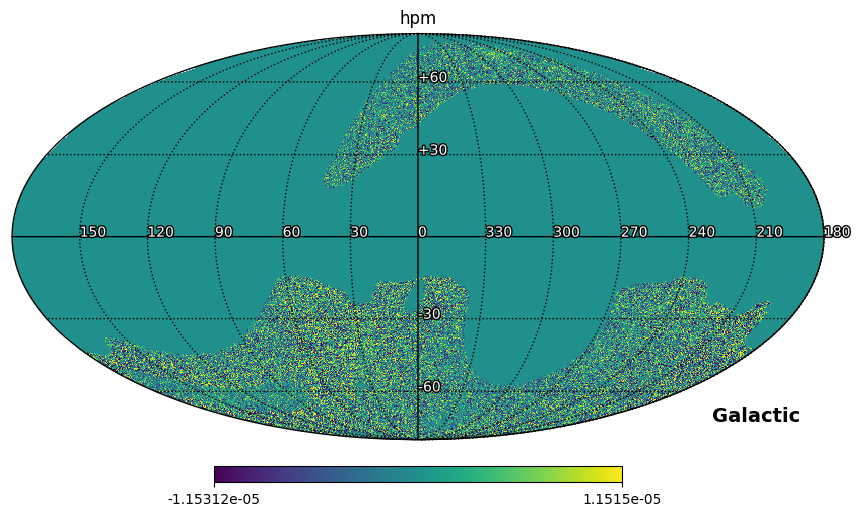

In [153]:
hp.mollview(act_hpm, 
            min=np.percentile(act_hpm, 1),    
            max=np.percentile(act_hpm, 99),
            title='hpm', fig=1, coord=["G"])
incolor = "white"
fgcolor = "black"
lw = 2

# Horizontal labels
lon_values = [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]
for lon in lon_values:
    text_label = str(lon)
    hp.visufunc.projtext(lon, 0.0, text_label, lonlat=True, coord="G",
        color=incolor).set_path_effects([path_effects.Stroke(linewidth=lw,
        foreground=fgcolor),path_effects.Normal()])

# Vertical labels at lon=0
lat_values_0 = [30, 60, -30, -60]
# lat_values_0 = [15, 30, 45, 60, 75]
for lat in lat_values_0:
    text_label = f"{'+' if lat > 0 else '-'}{abs(lat)}"
    hp.visufunc.projtext(0.0, lat, text_label, lonlat=True, coord="G",
        color=incolor).set_path_effects([path_effects.Stroke(linewidth=lw,
        foreground=fgcolor),path_effects.Normal()])

hp.graticule()

In [ ]:
def count_nside(map):
    return (len(map) / 12) ** 0.5
count_nside(ymap), count_nside(hpm), len(ymap) / len(hpm)

In [ ]:
# Координаты центра
ra_center, dec_center = 40, 4

# Преобразуем ACT в HEALPix
hpm = reproject.map2healpix(ymap2, nside=2048, lmax=6000)

# Преобразуем координаты центра в галактические для Planck
coord_center = SkyCoord(ra=ra_center*u.degree, dec=dec_center*u.degree, frame='icrs')
coord_galactic = coord_center.galactic

In [ ]:
hp.gnomview(ymap, 
            rot=(coord_galactic.l.degree, coord_galactic.b.degree), 
            coord=('G', 'C'), 
            xsize=40, reso=1.7,
            cmap="viridis", 
            return_projected_map=False)
plt.show()

In [ ]:
# hpm_g = reproject.map2healpix(ymap2, nside=2048, lmax=6000, rot=[0,0,0])
hpm_g = reproject.map2healpix(ymap2, nside=2048, lmax=30000, rot=[0,0,0]) 


In [ ]:
hpm_g2 = reproject.map2healpix(ymap2, nside=2048*4, lmax=25000, rot=[0,0,0]) 

In [53]:
# Посмотреть информацию о карте
# print(f"NSIDE: {hp.get_nside(hpm_g2)}")
# print(f"Угловое разрешение: {hp.nside2resol(hp.get_nside(hpm_g2), arcmin=True):.2f}'")
print(f"NSIDE: {hp.get_nside(ymap2)}")
print(f"Угловое разрешение: {hp.nside2resol(hp.get_nside(ymap2), arcmin=True):.2f}'")

NSIDE: 60
Угловое разрешение: 58.63'


In [54]:
# Сравним статистику
print("\nACT in HEALPix:")
print(f"  NSIDE: {hp.get_nside(act_hpm)}")
print(f"  Разрешение: {hp.nside2resol(hp.get_nside(act_hpm), arcmin=True):.5f}'")
print(f"  Min: {np.min(act_hpm):.2e}, Max: {np.max(act_hpm):.2e}") 
print(f"  Std: {np.std(act_hpm):.2e}")


print("\Planck in HEALPix:")
print(f"  NSIDE: {hp.get_nside(planck_hpm)}")
print(f"  Разрешение: {hp.nside2resol(hp.get_nside(planck_hpm), arcmin=True):.5f}'")
print(f"  Min: {np.min(planck_hpm):.2e}, Max: {np.max(planck_hpm):.2e}") 
print(f"  Std: {np.std(planck_hpm):.2e}")


ACT in HEALPix:
  NSIDE: 8192
  Разрешение: 0.42944'
  Min: -6.86e-05, Max: 2.32e-04
  Std: 3.49e-06
\Planck in HEALPix:
  NSIDE: 2048
  Разрешение: 1.71774'
  Min: -1.16e-03, Max: 6.73e-04
  Std: 4.58e-06


In [215]:
ra_center, dec_center = 240, -45
# Получить нативную проекцию gnomview без ресайза
img = hp.gnomview(hpm_g2, rot=(ra_center, dec_center), coord=['C', 'C'],
                  return_projected_map=True, xsize=40,  # Возвращает массив вместо отображения
                  no_plot=False, reso=1)

img = hp.gnomview(hpm_g2, rot=(ra_center, dec_center), coord=['C', 'C'],
                  return_projected_map=True, xsize=40 * 1.7 / 0.43,  # Возвращает массив вместо отображения
                  no_plot=False, reso=0.5)


plt.figure(figsize=(8, 8))
plt.imshow(img, cmap='viridis', origin='lower', 
           extent=[-0.5665, 0.5665, -0.5665, 0.5665])  # в градусах
plt.show()

NameError: name 'hpm_g2' is not defined

In [16]:
hpm_g3 = reproject.map2healpix(ymap2, nside=2048*4, lmax=25000, rot="cel,gal") 

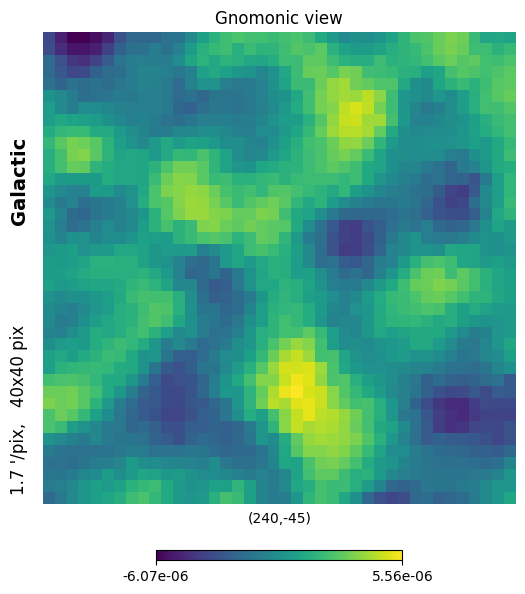

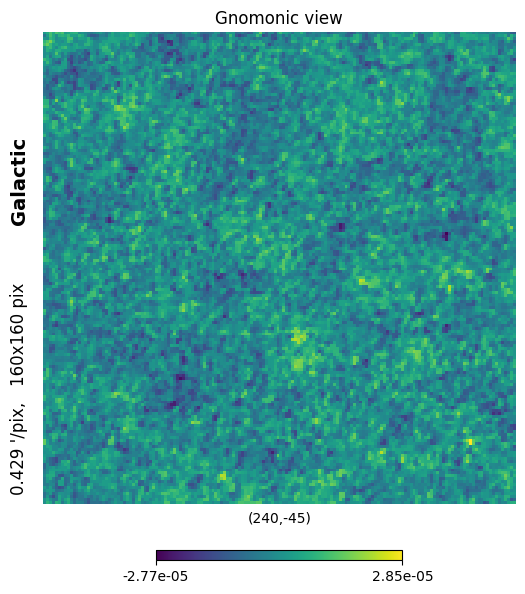

In [6]:
ra_center, dec_center = 240, -45
# ra_center, dec_center = (236.60508792441044, 74.31445683008675)
hp.gnomview(planck_hpm, rot=(ra_center, dec_center), coord=('G', 'G'), xsize=40, reso=1.7,
            cmap="viridis", return_projected_map=False)
plt.show()
# ra_center, dec_center = 40* utils.degree, 4* utils.degree
img = hp.gnomview(act_hpm, rot=(ra_center, dec_center), coord=['G', 'G'],
                  return_projected_map=True, xsize=40 * 4, 
                  no_plot=False, reso=0.429)

plt.show()


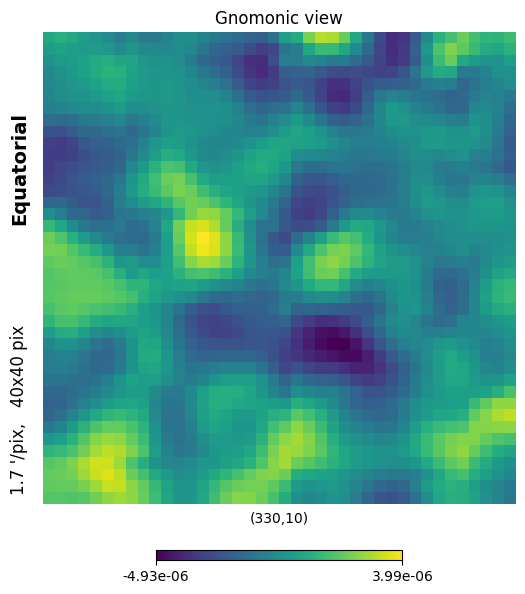

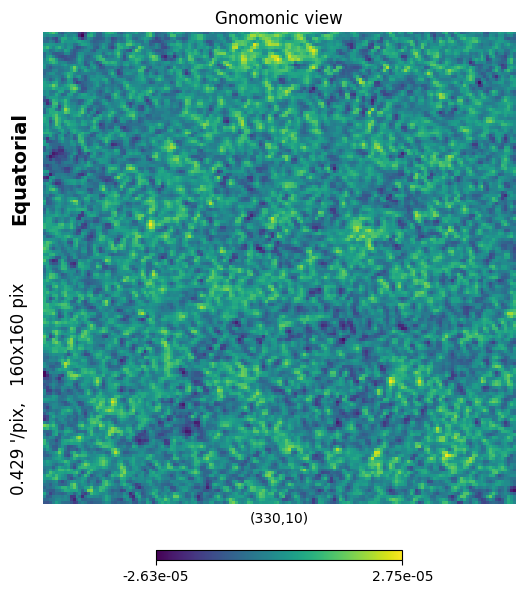

NameError: name 'ymap2' is not defined

In [20]:
ra_center, dec_center = 330, 10
# ra_center, dec_center = (236.60508792441044, 74.31445683008675)
hp.gnomview(planck_hpm, rot=(ra_center, dec_center), coord=('G', 'C'), xsize=40, reso=1.7,
            cmap="viridis", return_projected_map=False)
plt.show()
# ra_center, dec_center = 40* utils.degree, 4* utils.degree
img = hp.gnomview(act_hpm, rot=(ra_center, dec_center), coord=['G', 'C'],
                  return_projected_map=True, xsize=40 * 4, 
                  no_plot=False, reso=0.429)

plt.show()

patch_size = 1.7*40/60
ra_center, dec_center = ra_center* utils.degree, dec_center* utils.degree
radius  = patch_size/2. * utils.degree
imap_sub = ymap2.submap([[dec_center - radius, ra_center - radius], [dec_center + radius, ra_center + radius]])
eshow(imap_sub, upgrade=3, color='viridis')
imap_sub

In [4]:
act_hpm = hp.read_map('/home/jupyter/datasphere/filestore/datasets/act_galactic_map.fits')
# ymap = hp.read_map("PR4_NILC_y_map.fits", field=(1), h=False)



In [5]:
import numpy as np
import healpy as hp
from pixell import enmap

def create_patch_geometry(ra_deg, dec_deg, diameter_arcmin, pixscale_arcmin=0.5):
    """Создает геометрию для патча с заданным диаметром в угловых минутах"""
    
    diameter_deg = diameter_arcmin / 60.0
    pixscale_deg = pixscale_arcmin / 60.0
    pix_size = int(diameter_arcmin / pixscale_arcmin)  # 16' / 0.5' = 32 пикселя
    
    # Создаем bounding box в градусах
    width_deg = diameter_deg
    
    shape, wcs = enmap.geometry(
        pos=np.deg2rad([
            [dec_deg - width_deg / 2, ra_deg - width_deg / 2], 
            [dec_deg + width_deg / 2, ra_deg + width_deg / 2]
        ]),
        shape=(pix_size, pix_size),
        # proj="car"  # Plate Carrée projection
    )
    
    return shape, wcs

# # Пример использования для ваших центров
# centers = [
#     (236.60508792441044, 74.31445683008675),   # (ra, dec) в градусах
#     (29, 40)    # (ra, dec) в градусах  
# ]
# # centers = act_centers
# for i, (ra, dec) in enumerate(centers):
#     shape, wcs = create_patch_geometry(ra, dec, diameter_arcmin=16, pixscale_arcmin=0.5)
#     print(f"Патч {i}: shape={shape}, center=({ra}, {dec})|", wcs)

In [6]:
def healpix_to_enmap_patch(healpix_map, ra_deg, dec_deg, diameter_arcmin=16, pixscale_arcmin=0.5):
    """Конвертирует область HEALPix карты в enmap патч"""
    
    # Создаем геометрию
    shape, wcs = create_patch_geometry(ra_deg, dec_deg, diameter_arcmin, pixscale_arcmin)
    
    # Создаем пустую enmap с нужной геометрией
    patch = enmap.zeros(shape, wcs=wcs)
    
    # Получаем координаты каждого пикселя в enmap
    coords = patch.posmap()  # возвращает (2, Ny, Nx) где [0,...] - dec, [1,...] - ra
    
    # Конвертируем в theta, phi для HEALPix
    dec_rad = coords[0]  # theta в радианах
    ra_rad = coords[1]   # phi в радианах
    
    # HEALPix использует theta = pi/2 - dec
    theta = np.pi/2 - dec_rad
    phi = ra_rad
    
    # Интерполируем значения из HEALPix карты
    patch_data = hp.get_interp_val(healpix_map, theta.flatten(), phi.flatten())
    patch_data = patch_data.reshape(shape)
    
    # Заполняем enmap
    patch[:] = patch_data
    
    return patch

# Создаем патчи из ваших HEALPix карт
act_patches = []
planck_patches = []
# centers = act_centers
for ra, dec in centers:
    act_patch = healpix_to_enmap_patch(act_hpm, ra, dec, diameter_arcmin=16, pixscale_arcmin=0.5)
    planck_patch = healpix_to_enmap_patch(planck_hpm, ra, dec, diameter_arcmin=16, pixscale_arcmin=0.5)
    
    act_patches.append(act_patch)
    planck_patches.append(planck_patch)
    
    # print(f"Создан патч: {act_patch.shape}, разрешение: {act_patch.wcs.wcs.cdelt[1]*60:.2f}'/пиксель")

NameError: name 'centers' is not defined

In [ ]:
def healpix_to_patch(healpix_map, ra_deg, dec_deg, diameter_arcmin=16, pixscale_arcmin=0.5):
    """Конвертирует область HEALPix карты в патч"""
    
    diameter_deg = diameter_arcmin / 60.0
    pixscale_deg = pixscale_arcmin / 60.0
    pix_size = int(diameter_arcmin / pixscale_arcmin)  # 32 пикселя
    
    # Создаем сетку координат вручную
    ra_center = np.radians(ra_deg)
    dec_center = np.radians(dec_deg)
    half_size = diameter_deg / 2 * np.pi / 180  # в радианах
    
    # Сетка RA, Dec
    ra_grid = np.linspace(ra_center - half_size, ra_center + half_size, pix_size)
    dec_grid = np.linspace(dec_center - half_size, dec_center + half_size, pix_size)
    
    ra_mesh, dec_mesh = np.meshgrid(ra_grid, dec_grid)
    
    # Конвертируем в theta, phi для HEALPix
    theta = np.pi/2 - dec_mesh
    phi = ra_mesh
    
    # Интерполируем
    patch_data = hp.get_interp_val(healpix_map, theta.flatten(), phi.flatten())
    return patch_data.reshape(pix_size, pix_size)

# # Создаем патчи из ваших HEALPix карт
# act_patches = []
# planck_patches = []
# # centers = act_centers
# for ra, dec in centers:
#     act_patch = healpix_to_enmap_patch(act_hpm, ra, dec, diameter_arcmin=16, pixscale_arcmin=0.5)
#     planck_patch = healpix_to_enmap_patch(planck_hpm, ra, dec, diameter_arcmin=16, pixscale_arcmin=0.5)
    
#     act_patches.append(act_patch)
#     planck_patches.append(planck_patch)
    
    # print(f"Создан патч: {act_patch.shape}, разрешение: {act_patch.wcs.wcs.cdelt[1]*60:.2f}'/пиксель")

In [53]:
centers

[{'ra': 0.0,
  'dec': -60.13333333333344,
  'mask_fraction': 1.0,
  'quality': 5.194844952015687e-06,
  'check_points_used': 129},
 {'ra': 0.0,
  'dec': -59.60000000000011,
  'mask_fraction': 1.0,
  'quality': 5.401504875062272e-06,
  'check_points_used': 129},
 {'ra': 0.0,
  'dec': -59.06666666666678,
  'mask_fraction': 1.0,
  'quality': 5.164151651760985e-06,
  'check_points_used': 129},
 {'ra': 0.0,
  'dec': -58.533333333333445,
  'mask_fraction': 1.0,
  'quality': 5.120154459108393e-06,
  'check_points_used': 129},
 {'ra': 0.0,
  'dec': -58.000000000000114,
  'mask_fraction': 1.0,
  'quality': 5.29911834252985e-06,
  'check_points_used': 129},
 {'ra': 0.0,
  'dec': -57.46666666666678,
  'mask_fraction': 1.0,
  'quality': 5.3120518927142714e-06,
  'check_points_used': 129},
 {'ra': 0.0,
  'dec': -56.93333333333345,
  'mask_fraction': 1.0,
  'quality': 5.162036182691282e-06,
  'check_points_used': 129},
 {'ra': 0.0,
  'dec': -56.40000000000012,
  'mask_fraction': 1.0,
  'quality': 5.

In [59]:
def create_dataset(healpix_maps, centers, diameter_arcmin=16, pixscale_arcmin=0.5):
    """Создает датасет из нескольких HEALPix карт"""
    
    dataset = {}
    
    for map_name, healpix_map in healpix_maps.items():
        patches = []
        
        for i, (ra, dec) in enumerate(centers):
            patch = healpix_to_patch(healpix_map, ra, dec, diameter_arcmin, pixscale_arcmin)
            patches.append(patch)
            if i % 1000 == 0:
                print(f"{map_name} патч {i}: shape={patch.shape}, center=({ra}, {dec})")
        
        dataset[map_name] = patches
    
    # Добавляем метаданные
    dataset['metadata'] = {
        'centers': centers,
        'diameter_arcmin': diameter_arcmin,
        'pixscale_arcmin': pixscale_arcmin,
        'patch_shape': patches[0].shape if patches else None
    }
    
    return dataset

# Создаем датасет
healpix_maps = {
    'ACT': act_hpm,
    'Planck': planck_hpm
}

# dataset = create_enmap_dataset(healpix_maps, centers, diameter_arcmin=64, pixscale_arcmin=0.5)
dataset = create_dataset(healpix_maps, gal_centers, diameter_arcmin=64, pixscale_arcmin=0.5)
# dataset

ACT патч 0: shape=(128, 128), center=(243.67327285585435, -29.118368713461038)
ACT патч 1000: shape=(128, 128), center=(236.7865330252656, -64.33449354454761)
ACT патч 2000: shape=(128, 128), center=(267.2532987005459, -64.52914692318367)
ACT патч 3000: shape=(128, 128), center=(241.96569971552046, -59.55060692358157)
ACT патч 4000: shape=(128, 128), center=(260.20385859010753, -45.409905333810485)
ACT патч 5000: shape=(128, 128), center=(252.59902405868706, -46.04928943641321)
ACT патч 6000: shape=(128, 128), center=(257.1941111902707, -30.07626031817392)
ACT патч 7000: shape=(128, 128), center=(32.07247508306912, -84.24986276859013)
ACT патч 8000: shape=(128, 128), center=(87.90806406006276, -84.75993922730154)
ACT патч 9000: shape=(128, 128), center=(345.199134882284, -78.87131171280194)
ACT патч 10000: shape=(128, 128), center=(255.1839615397665, -25.088761120820987)
ACT патч 11000: shape=(128, 128), center=(255.24829764676778, -27.310530555605073)
ACT патч 12000: shape=(128, 128),

In [ ]:
import matplotlib.pyplot as plt

def visualize_patches(dataset):
    """Визуализирует созданные патчи"""
    
    fig, axes = plt.subplots(2, len(dataset['metadata']['centers']), figsize=(15, 8))
    
    for i, (ra, dec) in enumerate(dataset['metadata']['centers']):
        print(i)

        # ACT патчи
        act_patch = dataset['ACT'][i]
        ax = axes[0, i] if len(centers) > 1 else axes[0]
        im1 = ax.imshow(act_patch, origin='lower', cmap='viridis')
        ax.set_title(f'ACT Patch {i}\nRA={ra}, DEC={dec}')
        plt.colorbar(im1, ax=ax)
        
        # Planck патчи
        planck_patch = dataset['Planck'][i]
        ax = axes[1, i] if len(centers) > 1 else axes[1]
        im2 = ax.imshow(planck_patch, origin='lower', cmap='viridis')
        ax.set_title(f'Planck Patch {i}\nRA={ra}, DEC={dec}')
        plt.colorbar(im2, ax=ax)
    
    # plt.tight_layout()
    plt.show()

# Визуализируем
visualize_patches(dataset)
print(dataset["ACT"][0])
print(dataset["Planck"][0])

In [ ]:
import matplotlib.pyplot as plt

def visualize_single_pair(dataset, index=0):
    """Визуализирует одну пару ACT/Planck патчей"""
    
    centers = dataset['metadata']['centers']
    
    if index >= len(centers):
        print(f"Ошибка: индекс {index} превышает количество центров ({len(centers)})")
        return
    
    ra, dec = centers[index]
    # Создаем figure с двумя subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    
    # Получаем патчи
    act_patch = dataset['ACT'][index]
    planck_patch = dataset['Planck'][index]
    
    # Вычисляем общие пределы по цвету
    vmin_act, vmax_act = np.percentile(act_patch, [2, 98])
    vmin_planck, vmax_planck = np.percentile(planck_patch, [2, 98])
    
    # Берем самые широкие пределы из двух карт
    vmin = min(vmin_act, vmin_planck)
    vmax = max(vmax_act, vmax_planck)
    
    im1 = ax1.imshow(act_patch, origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
    ax1.set_title(f'ACT Patch {index}\nRA={ra:.2f}, DEC={dec:.2f}')
    plt.colorbar(im1, ax=ax1)
    
    im2 = ax2.imshow(planck_patch, origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
    ax2.set_title(f'Planck Patch {index}\nRA={ra:.2f}, DEC={dec:.2f}')
    plt.colorbar(im2, ax=ax2)
    

    
    plt.tight_layout()
    plt.show()
    
    # Выводим статистику
    print(f"=== ПАТЧ {index} ===")
    print(f"Координаты: RA={ra:.2f}°, DEC={dec:.2f}°")
    print(f"ACT: min={act_patch.min():.2e}, max={act_patch.max():.2e}, mean={act_patch.mean():.2e}, std={act_patch.std():.2e}")
    print(f"Planck: min={planck_patch.min():.2e}, max={planck_patch.max():.2e}, mean={planck_patch.mean():.2e}, std={planck_patch.std():.2e}")

# Использование

In [ ]:
# visualize_single_pair(dataset, index=0)  # Первая пара
visualize_single_pair(dataset, index=24717) # Конкретная пара
# visualize_single_pair(dataset, index=23000-1) # Конкретная пара
# len(dataset["ACT"])

In [172]:
ra, dec = 210, 5
print(check_in_mask(ra, dec, mask))
print(check_in_mask_galactic(ra, dec, mask))
print(check_in_mask_galactic_fast(ra, dec, mask))

1
0
1


In [170]:
from astropy.coordinates import SkyCoord
import astropy.units as u
import numpy as np

def check_in_mask_galactic(ra, dec, mask):
    """
    Проверяет, находятся ли галактические координаты в маске экваториальной системы
    
    Parameters:
    ra, dec: галактические координаты (l, b) в градусах
    mask: маска в экваториальной системе координат
    """
    # Преобразуем галактические координаты в экваториальные
    gal_coord = SkyCoord(l=ra*u.degree, b=dec*u.degree, frame='galactic')
    eq_coord = gal_coord.icrs  # преобразуем в экваториальную систему (ICRS)
    
    # Теперь используем экваториальные координаты
    coords_rad = np.deg2rad([eq_coord.dec.degree, eq_coord.ra.degree])  # (dec, ra)
    pix = mask.sky2pix(coords_rad)
    pix_int = np.round(pix).astype(int)
    
    ny, nx = mask.shape
    inside = (0 <= pix_int[0] < ny) and (0 <= pix_int[1] < nx)
    
    if inside:
        return int(mask[tuple(pix_int)] > 0)
    else:
        return 0

def check_in_mask_galactic_fast(ra, dec, mask):
    """
    Быстрая проверка галактических координат в маске
    """
    # Если координаты уже в экваториальной системе, используем прямое преобразование
    coords_rad = np.deg2rad([dec, ra])  # (dec, ra)
    pix = mask.sky2pix(coords_rad)
    pix_int = np.round(pix).astype(int)
    
    ny, nx = mask.shape
    inside = (0 <= pix_int[0] < ny) and (0 <= pix_int[1] < nx)
    
    if inside:
        return int(mask[tuple(pix_int)] > 0)
    else:
        return 0


0

In [129]:
from astropy.coordinates import SkyCoord
import astropy.units as u
import numpy as np

def check_in_mask_galactic(ra, dec, mask):
    """
    Проверяет, находятся ли галактические координаты в маске экваториальной системы
    
    Parameters:
    ra, dec: галактические координаты (l, b) в градусах
    mask: маска в экваториальной системе координат
    """
    # Преобразуем галактические координаты в экваториальные
    gal_coord = SkyCoord(l=ra*u.degree, b=dec*u.degree, frame='galactic')
    eq_coord = gal_coord.icrs  # преобразуем в экваториальную систему (ICRS)
    
    # Теперь используем экваториальные координаты
    coords_rad = np.deg2rad([eq_coord.dec.degree, eq_coord.ra.degree])  # (dec, ra)
    pix = mask.sky2pix(coords_rad)
    pix_int = np.round(pix).astype(int)
    
    ny, nx = mask.shape
    inside = (0 <= pix_int[0] < ny) and (0 <= pix_int[1] < nx)
    
    if inside:
        return int(mask[tuple(pix_int)] > 0)
    else:
        return 0

In [ ]:
print(dataset["ACT"][-2] )
print(dataset["Planck"][-2])

In [26]:
import numpy as np
import healpy as hp
from tqdm import tqdm

def sample_quality_centers(healpix_map, n_centers=1000, patch_diameter_arcmin=16, 
                          pixscale_arcmin=0.5, max_attempts=100000, noise_threshold=5e-8,
                          max_noise_fraction=0.1):
    """Сэмплирует центры пока не наберет n_centers качественных"""
    
    nside = hp.get_nside(healpix_map)
    good_centers = []
    attempts = 0
    
    # Предварительная проверка порогов
    abs_map = np.abs(healpix_map)
    data_fraction = np.sum(abs_map > noise_threshold) / len(healpix_map)
    print(f"Общая доля данных выше {noise_threshold:.1e}: {data_fraction:.3f}")
    
    with tqdm(total=n_centers, desc="Поиск качественных центров") as pbar:
        while len(good_centers) < n_centers and attempts < max_attempts:
            attempts += 1
            
            # Случайный центр в градусах
            ra = np.random.uniform(0, 360)
            dec = np.random.uniform(-85, 85)  # избегаем полюсов
            
            try:
                # Создаем патч
                patch = healpix_to_enmap_patch(
                    healpix_map, ra, dec, 
                    diameter_arcmin=patch_diameter_arcmin,
                    pixscale_arcmin=pixscale_arcmin
                )
                
                # Проверяем качество данных
                patch_data = patch.copy()
                abs_patch = np.abs(patch_data)
                
                # Доля "шумовых" пикселей (ниже порога)
                noise_fraction = np.sum(abs_patch < noise_threshold) / abs_patch.size
                
                # Дополнительные критерии качества
                patch_std = np.std(patch_data)
                patch_mean_abs = np.mean(abs_patch)
                
                # Проверяем критерии
                if (noise_fraction <= max_noise_fraction and 
                    patch_std > 0 and  # исключаем постоянные патчи
                    not np.isnan(patch_std)):  # исключаем NaN
                    
                    # Вычисляем качество (можно настроить)
                    quality = patch_std * (1 - noise_fraction)
                    
                    good_centers.append({
                        'ra': ra,
                        'dec': dec, 
                        'quality': quality,
                        'noise_fraction': noise_fraction,
                        'std': patch_std,
                        'mean_abs': patch_mean_abs,
                        'patch_shape': patch.shape
                    })
                    
                    pbar.update(1)
                    pbar.set_postfix({
                        'attempts': attempts,
                        'noise_frac': f'{noise_fraction:.3f}',
                        'quality': f'{quality:.2e}'
                    })
                    
            except Exception as e:
                # Пропускаем центры с ошибками (около полюсов и т.д.)
                continue
    
    print(f"\nЗавершено: {len(good_centers)}/{n_centers} центров")
    print(f"Успешность: {len(good_centers)/attempts*100:.1f}%")
    print(f"Всего попыток: {attempts}")
    
    # Сортируем по качеству
    good_centers.sort(key=lambda x: x['quality'], reverse=True)
    # return good_centers
    return list(map(lambda x: (x["ra"], x["dec"]),good_centers))


In [58]:
centers = sample_quality_centers(
    act_hpm,
    n_centers=10000,
    patch_diameter_arcmin=64,
    pixscale_arcmin=0.5,
    max_attempts=5000000,  # много попыток для большого количества
    noise_threshold=1e-7,
    max_noise_fraction=0.05
)

Общая доля данных выше 1.0e-07: 0.333


Поиск качественных центров: 100%|██████████| 10000/10000 [02:16<00:00, 73.42it/s, attempts=24466, noise_frac=0.019, quality=4.25e-06]


Завершено: 10000/10000 центров
Успешность: 40.9%
Всего попыток: 24466


In [17]:
def check_in_mask(ra, dec, mask):
    ny, nx = mask.shape
    coords_rad = np.deg2rad([dec, ra])  # (dec, ra)
    pix = mask.sky2pix(coords_rad)
    pix_int = np.round(pix).astype(int)
    inside = (0 <= pix_int[0] < ny) and (0 <= pix_int[1] < nx)
    if inside:
        return int(mask[tuple(pix_int)] > 0)
    else:
        return 0


In [56]:
centers[-1]

{'ra': 69.86666666666666,
 'dec': -15.333333333333599,
 'mask_fraction': 1.0,
 'quality': 1.0000786673456063e-08,
 'check_points_used': 129}

In [179]:
def find_centers_by_mask(healpix_map, mask, diameter_arcmin=16, step_arcmin=8, 
                        min_in_mask_fraction=0.95, nside=None):
    """Находит центры, где вся область диаметра находится внутри маски"""
    
    if nside is None:
        nside = hp.get_nside(healpix_map)
    
    radius_arcmin = diameter_arcmin / 2
    step_deg = step_arcmin / 60
    radius_deg = radius_arcmin / 60
    
    # Сетка для поиска по всему небу
    ra_grid = np.arange(0, 360, step_deg)
    dec_grid = np.arange(-90 + radius_deg, 90 - radius_deg, step_deg)  # избегаем полюсов
    
    print(f"Сетка поиска: RA({len(ra_grid)}), Dec({len(dec_grid)})")
    print(f"Шаг: {step_arcmin}', Диаметр области: {diameter_arcmin}'")
    
    good_centers = []
    
    # Создаем сетку точек для проверки всей области
    n_check_points = int(diameter_arcmin / 2)  # точек для проверки
    check_offsets_deg = np.linspace(-radius_deg, radius_deg, n_check_points)
    
    total_points = len(ra_grid) * len(dec_grid)
    print(f"Всего точек для проверки: {total_points:,}")
    
    for ra in tqdm(ra_grid, desc="RA"):
        for dec in dec_grid:
            # Проверяем всю область диаметра
            points_in_mask = 0
            total_check_points = 0
            
            # Проверяем сетку точек внутри круга диаметра
            for dra in check_offsets_deg:
                for ddec in check_offsets_deg:
                    # Проверяем только точки внутри круга (не квадрата)
                    distance_deg = np.sqrt(dra**2 + ddec**2)
                    if distance_deg <= radius_deg:
                        check_ra = ra + dra
                        check_dec = dec + ddec
                        
                        # Нормализуем RA в [0, 360)
                        check_ra = check_ra % 360
                        
                        if check_in_mask(check_ra, check_dec, mask):
                            points_in_mask += 1
                        total_check_points += 1
            
            # Проверяем долю точек в маске
            if total_check_points > 0:
                fraction_in_mask = points_in_mask / total_check_points
                
                if fraction_in_mask >= min_in_mask_fraction:
                    # Дополнительная проверка - создаем патч и проверяем качество данных
                    try:
                        patch = healpix_to_patch(healpix_map, ra, dec, diameter_arcmin)
                        patch_std = np.std(patch)
                        
                        if patch_std > 1e-8:  # минимальное качество данных
                            good_centers.append({
                                'ra': ra,
                                'dec': dec,
                                'mask_fraction': fraction_in_mask,
                                'quality': patch_std,
                                'checked_points': total_check_points
                            })
                    except Exception:
                        continue
    
    print(f"Найдено центров: {len(good_centers)}")
    print(f"Успешность: {len(good_centers)/total_points*100:.3f}%")
    
    # Сортируем по качеству
    good_centers.sort(key=lambda x: x['quality'], reverse=True)
    
    return good_centers

In [ ]:
# Оптимизированная версия с предварительной проверкой центра
def find_centers_by_mask_optimized(healpix_map, mask, diameter_arcmin=16, step_arcmin=8,
                                  min_in_mask_fraction=0.95, nside=None):
    """Оптимизированная версия с быстрой проверкой центра"""
    
    if nside is None:
        nside = hp.get_nside(healpix_map)
    
    radius_arcmin = diameter_arcmin / 2
    step_deg = step_arcmin / 60
    radius_deg = radius_arcmin / 60
    
    ra_grid = np.arange(0, 360, step_deg)
    dec_grid = np.arange(-90 + radius_deg, 90 - radius_deg, step_deg)
    
    print(f"Оптимизированный поиск: {len(ra_grid)}×{len(dec_grid)} точек")
    
    good_centers = []
    
    # Подготовка точек для проверки (только граница + центр)
    n_radial = max(3, int(diameter_arcmin / 4))  # точек по радиусу
    n_angular = 8  # точек по углу
    
    check_points = []
    
    # Центр
    check_points.append((0, 0))
    
    # Граничные точки
    for r in np.linspace(radius_deg * 0.7, radius_deg, n_radial):
        for angle in np.linspace(0, 2*np.pi, n_angular, endpoint=False):
            dra = r * np.cos(angle)
            ddec = r * np.sin(angle)
            check_points.append((dra, ddec))
    
    total_points = len(ra_grid) * len(dec_grid)
    checked_count = 0
    
    for ra in tqdm(ra_grid, desc="Optimized search"):
        for dec in dec_grid:
            checked_count += 1
            
            # Быстрая проверка - сначала центр
            if not check_in_mask(ra, dec, mask):
                continue
            
            # Затем проверяем все точки области
            points_in_mask = 0
            for dra, ddec in check_points:
                check_ra = (ra + dra) % 360
                check_dec = dec + ddec
                
                # Проверяем что Dec в допустимом диапазоне
                if -90 <= check_dec <= 90:
                    if check_in_mask(check_ra, check_dec, mask):
                        points_in_mask += 1
            
            fraction_in_mask = points_in_mask / len(check_points)
            
            if fraction_in_mask >= min_in_mask_fraction:
                try:
                    patch = healpix_to_patch(healpix_map, ra, dec, diameter_arcmin)
                    patch_std = np.std(patch)
                    
                    if patch_std > 1e-8:
                        good_centers.append({
                            'ra': ra,
                            'dec': dec,
                            'mask_fraction': fraction_in_mask,
                            'quality': patch_std,
                            'check_points_used': len(check_points)
                        })
                except Exception:
                    continue
            
            # Прогресс
            # if checked_count % 1000 == 0:
                # print(f"Проверено: {checked_count}/{total_points} ({checked_count/total_points*100:.1f}%)")
    
    print(f"Найдено центров: {len(good_centers)}")
    print(f"Эффективность: {len(good_centers)/checked_count*100:.3f}%")
    
    # good_centers.sort(key=lambda x: x['quality'], reverse=True)
    return good_centers

In [ ]:
from multiprocessing import Pool, cpu_count
import numpy as np
import healpy as hp
from tqdm import tqdm
import time
from datetime import datetime, timedelta

def process_ra_chunk(args):
    """Обрабатывает chunk по RA в одном процессе"""
    ra_chunk, dec_grid, healpix_map, mask, diameter_arcmin, check_points, min_in_mask_fraction = args
    
    local_good_centers = []
    for ra in ra_chunk:
        for dec in dec_grid:
            if not check_in_mask_galactic(ra, dec, mask):
                continue
            
            points_in_mask = 0
            for dra, ddec in check_points:
                check_ra = (ra + dra) % 360
                check_dec = dec + ddec
                
                if -90 <= check_dec <= 90:
                    if check_in_mask_galactic(check_ra, check_dec, mask):
                        points_in_mask += 1
            
            fraction_in_mask = points_in_mask / len(check_points)
            
            if fraction_in_mask >= min_in_mask_fraction:
                try:
                    patch = healpix_to_patch(healpix_map, ra, dec, diameter_arcmin)
                    patch_std = np.std(patch)
                    
                    if patch_std > 1e-8:
                        local_good_centers.append({
                            'ra': ra,
                            'dec': dec,
                            'mask_fraction': fraction_in_mask,
                            'quality': patch_std,
                            'check_points_used': len(check_points)
                        })
                except Exception:
                    continue
    
    return local_good_centers

def find_centers_by_mask_optimized_parallel(healpix_map, mask, diameter_arcmin=16, step_arcmin=8,
                                           min_in_mask_fraction=0.95, nside=None, n_processes=None):
    """Оптимизированная параллельная версия с отслеживанием скорости"""
    
    if nside is None:
        nside = hp.get_nside(healpix_map)
    
    if n_processes is None:
        n_processes = min(cpu_count(), 8)
    
    radius_arcmin = diameter_arcmin / 2
    step_deg = step_arcmin / 60
    radius_deg = radius_arcmin / 60
    
    ra_grid = np.arange(0, 360, step_deg)
    dec_grid = np.arange(-90 + radius_deg, 90 - radius_deg, step_deg)
    
    total_points = len(ra_grid) * len(dec_grid)
    print(f"Параллельный поиск: {len(ra_grid)}×{len(dec_grid)} = {total_points} точек")
    print(f"Используется процессов: {n_processes}")
    
    # Подготовка точек для проверки
    n_radial = max(3, int(diameter_arcmin / 4))
    n_angular = 8
    
    check_points = []
    check_points.append((0, 0))
    for r in np.linspace(radius_deg * 0.7, radius_deg, n_radial):
        for angle in np.linspace(0, 2*np.pi, n_angular, endpoint=False):
            dra = r * np.cos(angle)
            ddec = r * np.sin(angle)
            check_points.append((dra, ddec))
    
    # Разбиваем по RA
    ra_chunks = np.array_split(ra_grid, n_processes)
    
    # Подготавливаем аргументы
    chunk_args = [(ra_chunk, dec_grid, healpix_map, mask, diameter_arcmin, 
                   check_points, min_in_mask_fraction) 
                  for ra_chunk in ra_chunks]
    
    # Запускаем параллельную обработку с расширенной статистикой
    start_time = time.time()
    points_processed = 0
    last_update_time = start_time
    last_points_count = 0
    
    with Pool(n_processes) as pool:
        results = []
        with tqdm(total=len(chunk_args), desc="Обработка chunks", 
                 unit="chunk", bar_format='{l_bar}{bar}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]') as pbar:
            
            for i, result in enumerate(pool.imap(process_ra_chunk, chunk_args)):
                results.append(result)
                
                # Обновляем статистику скорости
                current_time = time.time()
                elapsed_total = current_time - start_time
                
                # Предполагаем равномерное распределение точек по chunks
                chunk_points = len(ra_chunks[i]) * len(dec_grid)
                points_processed += chunk_points
                
                # Текущая скорость (точек в секунду)
                current_speed = chunk_points / (current_time - last_update_time)
                avg_speed = points_processed / elapsed_total
                
                # Прогноз времени завершения
                remaining_points = total_points - points_processed
                eta_seconds = remaining_points / avg_speed if avg_speed > 0 else 0
                eta_str = str(timedelta(seconds=int(eta_seconds)))
                
                # Обновляем описание прогресс-бара
                pbar.set_postfix({
                    'скорость': f'{current_speed:.1f} т/с',
                    'ср.скорость': f'{avg_speed:.1f} т/с', 
                    'ETA': eta_str,
                    'найдено': sum(len(r) for r in results)
                })
                pbar.update(1)
                
                last_update_time = current_time
    
    # Собираем результаты
    good_centers = []
    for result in results:
        good_centers.extend(result)
    
    total_time = time.time() - start_time
    print(f"\nЗавершено за {timedelta(seconds=int(total_time))}")
    print(f"Средняя скорость: {points_processed/total_time:.1f} точек/сек")
    print(f"Найдено центров: {len(good_centers)}")
    print(f"Эффективность: {len(good_centers)/total_points*100:.3f}%")
    
    good_centers.sort(key=lambda x: x['quality'], reverse=True)
    return good_centers

In [ ]:
# centers = find_centers_sequential_with_progress(
centers = find_centers_by_mask_optimized(
    act_hpm,
    mask,
    diameter_arcmin=64,
    step_arcmin=32
    # n_processes=7
)

In [24]:
def convert_centers_to_galactic(centers):
    """
    Преобразует центры из экваториальной в галактическую систему
    """
    if not centers:
        return []
    
    # Собираем экваториальные координаты (используем существующие ключи 'ra' и 'dec')
    ra_eq = [center['ra'] for center in centers]
    dec_eq = [center['dec'] for center in centers]
    
    print(f"Преобразование {len(centers)} центров в галактическую систему...")
    
    # Векторизованное преобразование
    eq_coords = SkyCoord(ra=ra_eq*u.degree, dec=dec_eq*u.degree, frame='icrs')
    gal_coords = eq_coords.galactic
    
    # Создаем список с галактическими координатами
    centers_gal = []
    for i, center in enumerate(centers):
        centers_gal.append({
            'ra_gal': gal_coords.l.degree[i],    # галактическая долгота
            'dec_gal': gal_coords.b.degree[i],   # галактическая широта  
            'ra_eq': center['ra'],               # сохраняем оригинальные экваториальные
            'dec_eq': center['dec'],
            'mask_fraction': center['mask_fraction'],
            'quality': center['quality'],
            'check_points_used': center.get('check_points_used', 0)  # сохраняем если есть
        })
    
    return centers_gal

In [57]:
gal_centers = convert_centers_to_galactic(centers)
# centers

Преобразование 24718 центров в галактическую систему...


In [58]:
gal_centers = list(map(lambda x: (x['ra_gal'], x['dec_gal']), gal_centers))

In [168]:
def find_centers_sequential_with_progress(healpix_map, mask, diameter_arcmin=16, step_arcmin=8,
                                        min_in_mask_fraction=0.95, nside=None):
    """Последовательная версия с прогресс-баром для тестирования"""
    
    if nside is None:
        nside = hp.get_nside(healpix_map)
    
    radius_arcmin = diameter_arcmin / 2
    step_deg = step_arcmin / 60
    radius_deg = radius_arcmin / 60
    
    ra_grid = np.arange(0, 360, step_deg)
    dec_grid = np.arange(-90 + radius_deg, 90 - radius_deg, step_deg)
    
    total_points = len(ra_grid) * len(dec_grid)
    print(f"Последовательный поиск: {len(ra_grid)}×{len(dec_grid)} = {total_points:,} точек")
    
    # Подготовка точек для проверки
    n_radial = max(3, int(diameter_arcmin / 4))
    n_angular = 8
    
    check_points = []
    check_points.append((0, 0))
    for r in np.linspace(radius_deg * 0.7, radius_deg, n_radial):
        for angle in np.linspace(0, 2*np.pi, n_angular, endpoint=False):
            dra = r * np.cos(angle)
            ddec = r * np.sin(angle)
            check_points.append((dra, ddec))
    
    good_centers = []
    start_time = time.time()
    
    with tqdm(total=total_points, desc="Обработка точек") as pbar:
        for ra in ra_grid:
            for dec in dec_grid:
                if not check_in_mask_galactic(ra, dec, mask):
                    pbar.update(1)
                    continue
                
                points_in_mask = 0
                for dra, ddec in check_points:
                    check_ra = (ra + dra) % 360
                    check_dec = dec + ddec
                    
                    if -90 <= check_dec <= 90:
                        if check_in_mask_galactic(check_ra, check_dec, mask):
                            points_in_mask += 1
                
                fraction_in_mask = points_in_mask / len(check_points)
                
                if fraction_in_mask >= min_in_mask_fraction:
                    try:
                        patch = healpix_to_patch(healpix_map, ra, dec, diameter_arcmin)
                        good_centers.append({
                            'ra': ra,
                            'dec': dec,
                            'mask_fraction': fraction_in_mask,
                            'quality': patch_std,
                            'check_points_used': len(check_points)
                        })
                    except Exception:
                        pass
                
                pbar.update(1)
                
                # Обновляем статистику каждые 100 точек
                if pbar.n % 100 == 0:
                    elapsed = time.time() - start_time
                    speed = pbar.n / elapsed
                    pbar.set_postfix({
                        'скорость': f'{speed:.1f} т/с',
                        'найдено': len(good_centers)
                    })
    
    total_time = time.time() - start_time
    print(f"\nЗавершено за {timedelta(seconds=int(total_time))}")
    print(f"Средняя скорость: {total_points/total_time:.1f} точек/сек")
    print(f"Найдено центров: {len(good_centers)}")
    
    good_centers.sort(key=lambda x: x['quality'], reverse=True)
    return good_centers

In [26]:
def save_dataset_fits_optimized(dataset, filename):
    """Оптимизированное сохранение - все патчи в одном расширении"""
    
    primary_hdu = fits.PrimaryHDU()
    primary_hdu.header['DATASET'] = 'Diffusion Training Data'
    primary_hdu.header['DIAMETER'] = dataset['metadata']['diameter_arcmin']
    primary_hdu.header['PIXSCALE'] = dataset['metadata']['pixscale_arcmin']
    primary_hdu.header['NPATCHES'] = len(dataset['metadata']['centers'])
    primary_hdu.header['SHAPE0'] = dataset['metadata']['patch_shape'][0]
    primary_hdu.header['SHAPE1'] = dataset['metadata']['patch_shape'][1]
    
    hdulist = [primary_hdu]
    
    # Центры
    centers_array = np.array(dataset['metadata']['centers'])
    centers_hdu = fits.BinTableHDU.from_columns([
        fits.Column(name='RA', format='D', array=centers_array[:, 0]),
        fits.Column(name='DEC', format='D', array=centers_array[:, 1])
    ])
    centers_hdu.header['EXTNAME'] = 'CENTERS'
    hdulist.append(centers_hdu)
    
    # Все ACT патчи в одном 3D массиве
    act_cube = np.array(dataset['ACT'])
    act_hdu = fits.ImageHDU(act_cube)
    act_hdu.header['EXTNAME'] = 'ACT_PATCHES'
    act_hdu.header['NAXIS3'] = len(dataset['ACT'])
    act_hdu.header['COMMENT'] = 'Shape: (n_patches, height, width)'
    hdulist.append(act_hdu)
    
    # Все Planck патчи в одном 3D массиве
    planck_cube = np.array(dataset['Planck'])
    planck_hdu = fits.ImageHDU(planck_cube)
    planck_hdu.header['EXTNAME'] = 'PLANCK_PATCHES'
    planck_hdu.header['NAXIS3'] = len(dataset['Planck'])
    planck_hdu.header['COMMENT'] = 'Shape: (n_patches, height, width)'
    hdulist.append(planck_hdu)
    
    hdul = fits.HDUList(hdulist)
    hdul.writeto(filename, overwrite=True)
    print(f"✅ Оптимизированный FITS сохранен: {filename}")

In [49]:
save_dataset_fits_optimized(dataset, "/home/jupyter/datasphere/filestore/datasets/mask_dataset.fits")

✅ Оптимизированный FITS сохранен: /home/jupyter/datasphere/filestore/datasets/mask_dataset.fits


In [71]:
! ls -la

total 6900228
drwxr-xr-x 1 jupyter jupyter        716 Oct 14 13:36 .
drwxrwxr-x 1 jupyter jupyter         44 Oct  9 16:35 ..
drwxr-xr-x 1 jupyter jupyter        616 Oct 14 13:33 .ipynb_checkpoints
-rw-r--r-- 1 jupyter jupyter    1586842 Oct 14 11:40 .~NBEATS_for_gpu.ipynb
-rw-r--r-- 1 jupyter jupyter 2621617920 Oct 14 13:38 64minutes_dataset.fits
-rw-r--r-- 1 jupyter jupyter 1207969920 Oct 10 08:21 PR4_NILC_y_map.fits
-rw-r--r-- 1 jupyter jupyter      36741 Oct 14 12:12 Untitled.ipynb
-rw-r--r-- 1 jupyter jupyter 3221233920 Oct 13 15:58 act_galactic_map.fits
drwxr-xr-x 1 jupyter jupyter         34 Oct 12 15:19 data
-rwx------ 1 jupyter jupyter      21076 Oct 10 14:16 dataflow_en.ipynb
-rw-r--r-- 1 jupyter jupyter      11642 Oct 13 15:01 diffusion_test.ipynb
-rw-r--r-- 1 jupyter jupyter      44361 Oct 12 20:43 input.png
drwxr-xr-x 1 jupyter jupyter         18 Oct 12 18:32 mnist_png
-rw-r--r-- 1 jupyter jupyter       2208 Oct 12 18:27 nemo.ipynb
-rw-r--r-- 1 jupyter jupyter        959 Oc

In [36]:
hp.write_map("act_galactic_map.fits", hpm_g3, overwrite=True)

setting the output map dtype to [dtype('float32')]


In [13]:
def load_mask(mask_path):
    """Загружает маску из FITS файла"""
    mask = enmap.read_map(mask_path)
    print(f"Маска загружена: shape={mask.shape}")
    print(f"Диапазон значений: [{mask.min()}, {mask.max()}]")
    print(f"Доля ненулевых пикселей: {np.mean(mask > 0):.3f}")
    return mask

In [14]:
mask = load_mask("wide_mask_GAL070_apod_1.50_deg_wExtended.fits")

Маска загружена: shape=(10320, 43200)
Диапазон значений: [0.0, 1.0]
Доля ненулевых пикселей: 0.519


In [8]:
!wget https://lambda.gsfc.nasa.gov/data/suborbital/ACT/ACT_adv/Compton_y_maps/ilc_actplanck_ymap.fits

--2025-10-13 13:31:12--  https://lambda.gsfc.nasa.gov/data/suborbital/ACT/ACT_adv/Compton_y_maps/ilc_actplanck_ymap.fits
Resolving lambda.gsfc.nasa.gov (lambda.gsfc.nasa.gov)... 129.164.179.68, 2001:4d0:2310:150::68
Connecting to lambda.gsfc.nasa.gov (lambda.gsfc.nasa.gov)|129.164.179.68|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1783298880 (1.7G)
Saving to: ‘ilc_actplanck_ymap.fits’

     0K .......... .......... .......... .......... ..........  0%  192K 2h30m
    50K .......... .......... .......... .......... ..........  0%  192K 2h31m
   100K .......... .......... .......... .......... ..........  0%  383K 2h6m
   150K .......... .......... .......... .......... ..........  0%  384K 1h53m
   200K .......... .......... .......... .......... ..........  0%  383K 1h45m
   250K .......... .......... .......... .......... ..........  0%  384K 1h40m
   300K .......... .......... .......... .......... ..........  0%  632K 92m58s
   350K .......... .........

In [10]:
def load_dataset_fits(filename):
    """Загружает датасет из FITS файла"""
    
    with fits.open(filename) as hdul:
        print(f"Загрузка FITS: {filename}")
        print(f"Расширения: {[hdu.name for hdu in hdul]}")
        
        dataset = {}
        
        # Читаем метаданные из primary HDU
        header = hdul[0].header
        metadata = {
            'diameter_arcmin': header.get('DIAMETER', 16),
            'pixscale_arcmin': header.get('PIXSCALE', 0.5),
            'patch_shape': (header.get('SHAPE0', 32), header.get('SHAPE1', 32))
        }
        
        # Загружаем центры
        centers_hdu = hdul['CENTERS']
        centers_data = centers_hdu.data
        centers = list(zip(centers_data['RA'], centers_data['DEC']))
        metadata['centers'] = centers
        
        # Проверяем структуру файла
        if 'ACT_PATCHES' in hdul and 'PLANCK_PATCHES' in hdul:
            # Оптимизированный формат
            act_cube = hdul['ACT_PATCHES'].data
            planck_cube = hdul['PLANCK_PATCHES'].data
            
            dataset['ACT'] = [act_cube[i] for i in range(act_cube.shape[0])]
            dataset['Planck'] = [planck_cube[i] for i in range(planck_cube.shape[0])]
            
        else:
            # Поиск отдельных расширений
            act_patches = []
            planck_patches = []
            
            for hdu in hdul:
                if hdu.name.startswith('ACT_'):
                    act_patches.append(hdu.data)
                elif hdu.name.startswith('PLANCK_'):
                    planck_patches.append(hdu.data)
            
            # Сортируем по имени чтобы сохранить порядок
            dataset['ACT'] = act_patches
            dataset['Planck'] = planck_patches
        
        dataset['metadata'] = metadata
        
        print(f"✅ Загружено:")
        print(f"   ACT патчей: {len(dataset['ACT'])}")
        print(f"   Planck патчей: {len(dataset['Planck'])}")
        print(f"   Центров: {len(centers)}")
        print(f"   Размер патча: {metadata['patch_shape']}")
        
        return dataset

In [11]:
loaded_dataset = load_dataset_fits("/home/jupyter/datasphere/filestore/datasets/mask_dataset.fits")

Загрузка FITS: /home/jupyter/datasphere/filestore/datasets/mask_dataset.fits
Расширения: ['PRIMARY', 'CENTERS', 'ACT_PATCHES', 'PLANCK_PATCHES']
✅ Загружено:
   ACT патчей: 24718
   Planck патчей: 24718
   Центров: 24718
   Размер патча: (128, 128)


In [52]:
loaded_dataset['ACT'][0]

array([[-6.69286339e-06, -6.25037782e-06, -5.05468322e-06, ...,
        -4.85116647e-07, -6.66752887e-07, -9.37757733e-07],
       [-5.16982662e-07, -1.42686763e-06, -1.66374350e-06, ...,
         4.78488998e-07,  4.81998883e-06,  6.31242112e-06],
       [-6.77407533e-07, -3.86314118e-07, -2.09594412e-07, ...,
         4.82003574e-06,  7.39329173e-06,  7.09564490e-06],
       ...,
       [-1.19638663e-07, -1.09303204e-07, -9.92292741e-08, ...,
         1.55169488e-08, -2.61666863e-07, -6.82752511e-07],
       [-8.87293999e-08, -9.79039842e-08, -9.89591836e-08, ...,
        -1.59151135e-07, -7.27206798e-08, -3.77400628e-08],
       [-1.08771464e-07, -1.15662608e-07, -1.22294094e-07, ...,
        -1.97660438e-07, -1.78756611e-07, -1.03621241e-07]], dtype='>f8')

In [7]:
dataset['ACT'][0]

NameError: name 'dataset' is not defined

In [16]:
!wget https://lambda.gsfc.nasa.gov/data/suborbital/ACT/ACT_adv/Compton_y_maps/wide_mask_GAL070_apod_1.50_deg_wExtended.fits

--2025-10-14 18:25:04--  https://lambda.gsfc.nasa.gov/data/suborbital/ACT/ACT_adv/Compton_y_maps/wide_mask_GAL070_apod_1.50_deg_wExtended.fits
Resolving lambda.gsfc.nasa.gov (lambda.gsfc.nasa.gov)... 129.164.179.68, 2001:4d0:2310:150::68
Connecting to lambda.gsfc.nasa.gov (lambda.gsfc.nasa.gov)|129.164.179.68|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1783298880 (1.7G)
Saving to: ‘wide_mask_GAL070_apod_1.50_deg_wExtended.fits’

     0K .......... .......... .......... .......... ..........  0%  194K 2h29m
    50K .......... .......... .......... .......... ..........  0%  193K 2h29m
   100K .......... .......... .......... .......... ..........  0%  193K 2h30m
   150K .......... .......... .......... .......... ..........  0%  386K 2h11m
   200K .......... .......... .......... .......... ..........  0%  382K 2h0m
   250K .......... .......... .......... .......... ..........  0%  378K 1h53m
   300K .......... .......... .......... .......... ..........  

In [158]:
import os
import signal
import psutil

def kill_all_workers():
    """Убивает все дочерние процессы"""
    current_pid = os.getpid()
    current_process = psutil.Process(current_pid)
    
    # Находим все дочерние процессы
    children = current_process.children(recursive=True)
    
    for child in children:
        try:
            print(f"Завершаем процесс {child.pid} ({child.name()})")
            child.terminate()
            child.wait(timeout=5)  # Ждем завершения
        except (psutil.NoSuchProcess, psutil.TimeoutExpired):
            try:
                child.kill()  # Принудительное завершение
            except psutil.NoSuchProcess:
                pass
    
    print(f"Завершено {len(children)} процессов")

# Использование
kill_all_workers()

Завершено 0 процессов


In [173]:
def find_centers_in_equatorial(healpix_map, mask, diameter_arcmin=16, step_arcmin=8,
                              min_in_mask_fraction=0.95):
    """
    Работаем полностью в экваториальной системе - максимальная скорость
    """
    radius_arcmin = diameter_arcmin / 2
    step_deg = step_arcmin / 60
    radius_deg = radius_arcmin / 60
    
    # Сетка в экваториальной системе
    ra_grid_eq = np.arange(0, 360, step_deg)
    dec_grid_eq = np.arange(-90 + radius_deg, 90 - radius_deg, step_deg)
    
    total_points = len(ra_grid_eq) * len(dec_grid_eq)
    print(f"Поиск в экваториальной системе: {total_points:,} точек")
    
    # Подготовка точек для проверки области
    n_radial = max(3, int(diameter_arcmin / 4))
    n_angular = 8
    
    check_offsets = []
    check_offsets.append((0, 0))
    for r in np.linspace(radius_deg * 0.7, radius_deg, n_radial):
        for angle in np.linspace(0, 2*np.pi, n_angular, endpoint=False):
            dra = r * np.cos(angle)
            ddec = r * np.sin(angle)
            check_offsets.append((dra, ddec))
    
    good_centers = []
    start_time = time.time()
    
    with tqdm(total=total_points, desc="Экваториальный поиск") as pbar:
        for ra in ra_grid_eq:
            for dec in dec_grid_eq:
                # Используем быструю функцию!
                if not check_in_mask(ra, dec, mask):
                    pbar.update(1)
                    continue
                
                # Проверяем точки области
                points_in_mask = 0
                for dra, ddec in check_offsets:
                    check_ra = (ra + dra) % 360
                    check_dec = dec + ddec
                    
                    if -90 <= check_dec <= 90:
                        if check_in_mask(check_ra, check_dec, mask):
                            points_in_mask += 1
                
                fraction_in_mask = points_in_mask / len(check_offsets)
                
                if fraction_in_mask >= min_in_mask_fraction:
                    try:
                        # Здесь нужно преобразовать в галактические для healpix?
                        # Или healpix_to_patch работает с экваториальными координатами?
                        patch = healpix_to_patch(healpix_map, ra, dec, diameter_arcmin)
                        patch_std = np.std(patch)
                        
                        if patch_std > 1e-8:
                            good_centers.append({
                                'ra': ra,
                                'dec': dec,
                                'mask_fraction': fraction_in_mask,
                                'quality': patch_std
                            })
                    except Exception:
                        pass
                
                pbar.update(1)
                
                if pbar.n % 100 == 0:
                    elapsed = time.time() - start_time
                    speed = pbar.n / elapsed
                    pbar.set_postfix({
                        'скорость': f'{speed:.1f} т/с',
                        'найдено': len(good_centers)
                    })
    
    total_time = time.time() - start_time
    print(f"\nСкорость: {total_points/total_time:.1f} точек/сек")
    return good_centers

In [1]:
!wget https://zenodo.org/records/7947597/files/Masks.fits

--2025-10-16 12:34:15--  https://zenodo.org/records/7947597/files/Masks.fits
Resolving zenodo.org (zenodo.org)... 188.185.43.25, 188.185.48.194, 188.185.45.92, ...
Connecting to zenodo.org (zenodo.org)|188.185.43.25|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 603990720 (576M) [application/octet-stream]
Saving to: ‘Masks.fits’

     0K .......... .......... .......... .......... ..........  0%  273K 35m57s
    50K .......... .......... .......... .......... ..........  0%  123M 18m1s
   100K .......... .......... .......... .......... ..........  0%  834K 15m56s
   150K .......... .......... .......... .......... ..........  0%  825K 14m56s
   200K .......... .......... .......... .......... ..........  0%  158M 11m57s
   250K .......... .......... .......... .......... ..........  0%  824K 11m57s
   300K .......... .......... .......... .......... ..........  0%  156M 10m15s
   350K .......... .......... .......... .......... ..........  0%  816K 10m28s
  

In [8]:
path = "./"
planck_mask = hp.read_map(path + "Masks.fits", field=0) * hp.read_map(path + "Masks.fits", field=1)*hp.read_map(path + "Masks.fits", field=2)

In [9]:
len(planck_mask[planck_mask > 0.2]), len(planck_mask[planck_mask > 0.5]), len(planck_mask)

(28656854, 28495594, 50331648)

In [ ]:
centers = list(filter(lambda x: check_in_mask(*x, planck_mask)))

In [14]:
loaded_dataset.keys(), loaded_dataset["metadata"].keys()

(dict_keys(['ACT', 'Planck', 'metadata']),
 dict_keys(['diameter_arcmin', 'pixscale_arcmin', 'patch_shape', 'centers']))

In [19]:
planck_mask

array([0.9999303, 0.9999303, 0.9999304, ..., 0.9999307, 0.9999306,
       0.9999308], dtype='>f4')

In [21]:
new_act = []
new_planck = []
new_centers = []

for i in range(len(loaded_dataset['ACT'])):
    ra, dec = loaded_dataset['metadata']['centers'][i]
    if check_in_mask_planck(ra, dec, planck_mask):
        new_act.append(loaded_dataset['ACT'][i])
        new_planck.append(loaded_dataset['Planck'][i])
        new_centers.append((ra, dec))


In [20]:
def check_in_mask_planck(ra, dec, mask):
    """
    Проверяет, находится ли точка (ra, dec) внутри маски HEALPix
    
    Parameters:
    ra, dec: float - прямое восхождение и склонение в градусах
    mask: array - HEALPix карта маски
    
    Returns:
    int: 1 если точка внутри маски (ненулевое значение), 0 если снаружи или за границами
    """
    # Получаем nside параметр из маски
    nside = hp.get_nside(mask)
    
    # Преобразуем координаты в радианы (healpy использует theta, phi в радианах)
    # theta = π/2 - dec, phi = ra
    theta = np.radians(90.0 - dec)
    phi = np.radians(ra)
    
    # Находим соответствующий пиксель
    pix = hp.ang2pix(nside, theta, phi)
    
    # Проверяем, что значение маски в этом пикселе больше 0
    return int(mask[pix] > 0)

In [23]:
len(new_act), len(loaded_dataset['ACT'])


(22865, 24718)

In [24]:
loaded_dataset['ACT'] = new_act
loaded_dataset['Planck'] = new_planck
loaded_dataset['metadata']['centers'] = new_centers

In [28]:
save_dataset_fits_optimized(loaded_dataset, "/home/jupyter/datasphere/filestore/datasets/3_mask_dataset.fits")

✅ Оптимизированный FITS сохранен: /home/jupyter/datasphere/filestore/datasets/3_mask_dataset.fits
